## Importing librairies

In [47]:
!pip install tensorflow 
!pip install librosa 

In [48]:
!pip install scipy


In [49]:
#!pip install scikit-learn
#!pip install pandas
#!pip install matplotlib
!pip install seaborn

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import sys
import os
import pickle
import librosa
import librosa.display
from IPython.display import Audio
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

## Read the CSV file

In [51]:
df = pd.read_csv('../../features_30_sec.csv', sep=',', header=0)
df.head()



,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794.0,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794.0,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794.0,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794.0,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794.0,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


## About the dataset

In [52]:
df.shape

(1100, 60)

In [53]:
df.dtypes

filename                    object
length                     float64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [54]:
df = df.drop(labels='filename', axis=1)

In [55]:
df

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,661794.0,0.350088,0.088757,0.130228,0.002827,1784.165850,1.297741e+05,2002.449060,85882.761315,3805.839606,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,661794.0,0.340914,0.094980,0.095948,0.002373,1530.176679,3.758501e+05,2039.036516,213843.755497,3550.522098,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,661794.0,0.363637,0.085275,0.175570,0.002746,1552.811865,1.564676e+05,1747.702312,76254.192257,3042.260232,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,661794.0,0.404785,0.093999,0.141093,0.006346,1070.106615,1.843559e+05,1596.412872,166441.494769,2184.745799,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,661794.0,0.308526,0.087841,0.091529,0.002303,1835.004266,3.433999e+05,1748.172116,88445.209036,3579.757627,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,30.0,0.317626,0.091026,0.256253,0.010873,2244.488313,1.008790e+06,2562.085269,183625.293751,4890.670427,...,39.721455,-4.222107,48.647827,4.080158,45.973675,-4.803177,68.233920,0.082538,49.958145,afrobeat
1096,30.0,0.350240,0.087974,0.317964,0.014596,1632.731459,3.379859e+05,2097.113953,257801.214129,3456.554099,...,64.329540,-9.575677,69.712220,-1.113993,114.923965,-10.964767,68.790276,0.061762,91.389410,afrobeat
1097,30.0,0.422172,0.080791,0.239201,0.016765,1889.431096,8.933278e+05,2153.873784,460536.440730,3909.526360,...,69.426550,0.653677,66.252090,2.757300,56.315994,5.344485,69.256580,8.365019,67.598520,afrobeat
1098,30.0,0.378991,0.100866,0.286072,0.018925,1900.198798,1.667491e+06,2144.893972,867227.171467,4050.875505,...,62.723360,-7.193225,75.669760,-2.915649,85.938510,-1.697499,101.583786,3.666762,84.415276,afrobeat


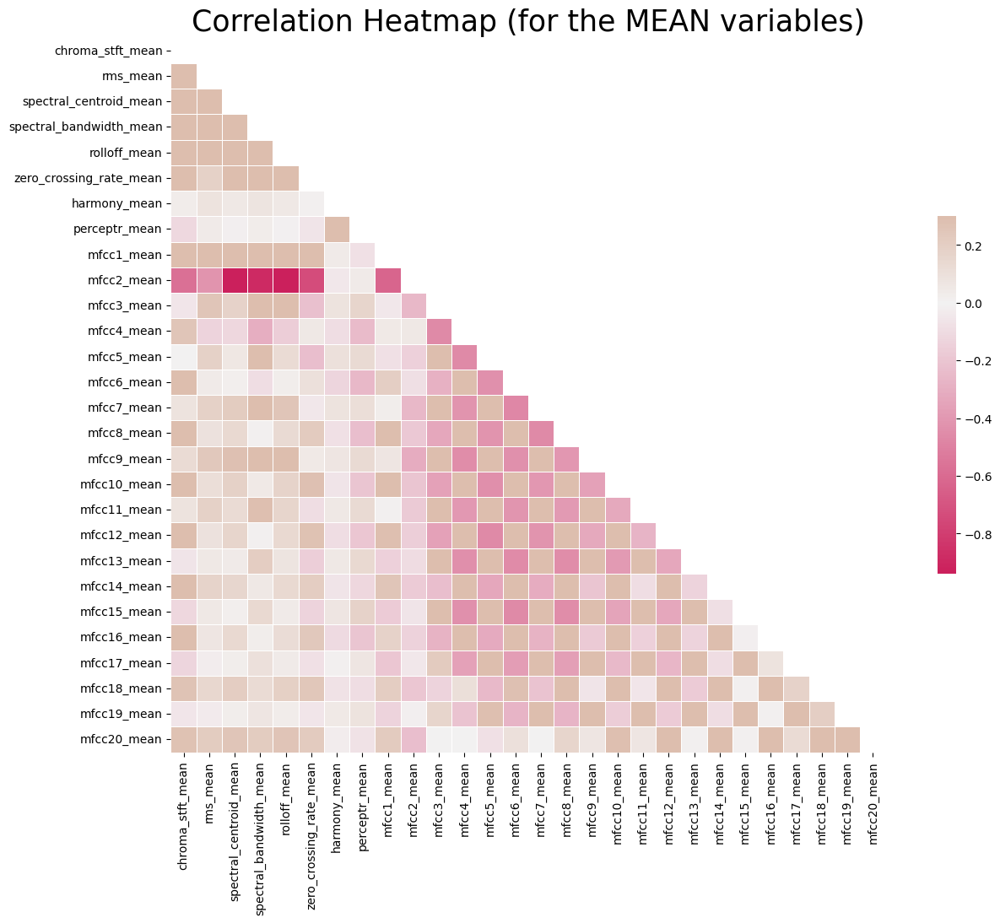

In [56]:
import seaborn as sns

# Computing the Correlation Matrix
spike_cols = [col for col in df.columns if 'mean' in col]
corr = df[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
plt.savefig("Corr Heatmap.jpg")


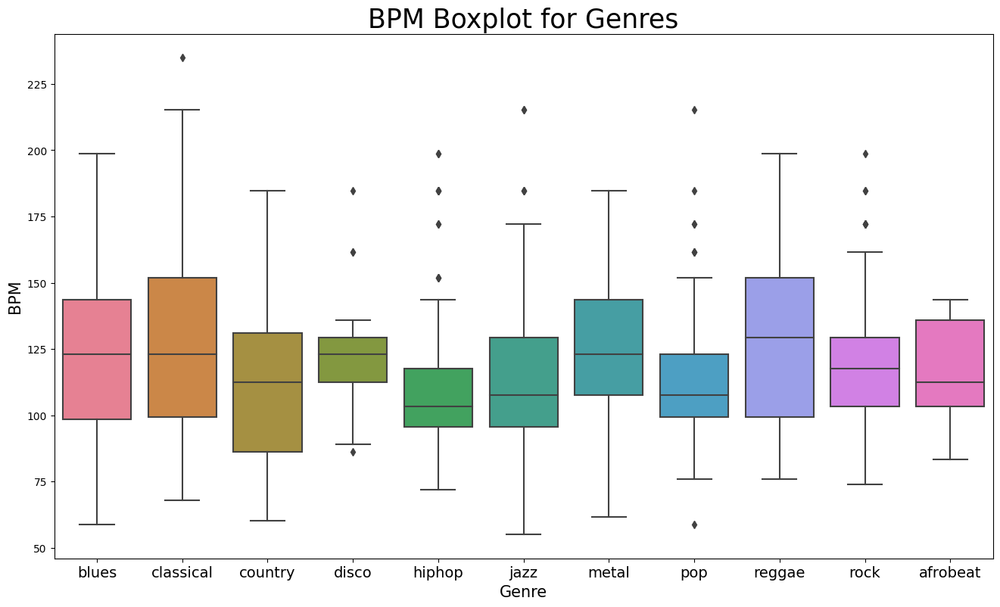

In [57]:
x = df[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

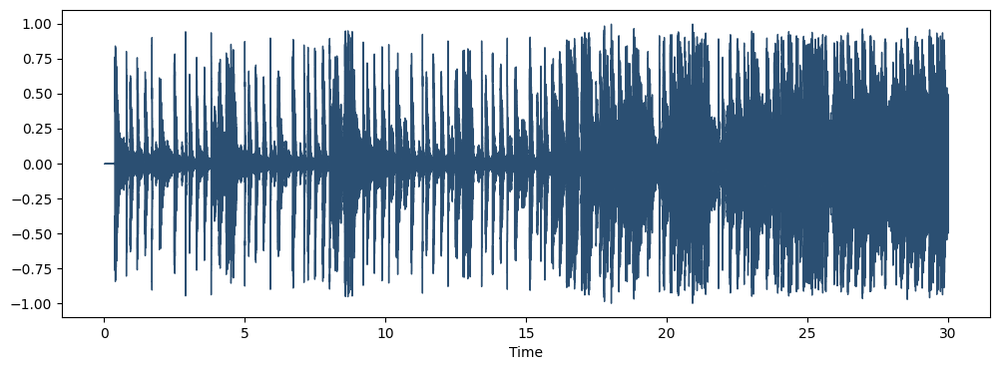

In [58]:
audio_file = "../genres_original/afrobeat/segment1_afrobeat_abracadabra.wav"
data, sr = librosa.load(audio_file)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(data, color='#2B4F72')
plt.show()

In [59]:
import IPython
IPython.display.Audio(data, rate=sr)

## Spectograms

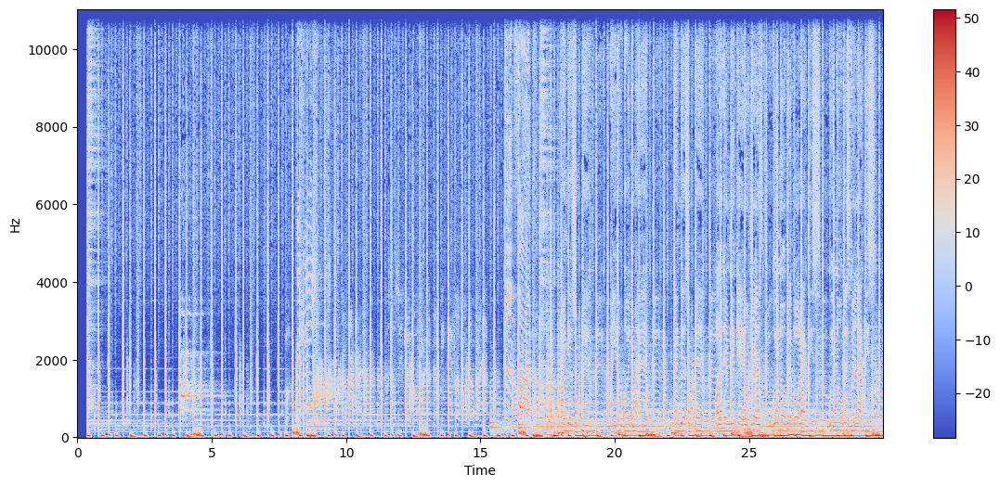

In [60]:
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(14,6))
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

## Spectral Rollof

It is the frequency below which a specified percentage of the total spectral energy, e.g 85% lies

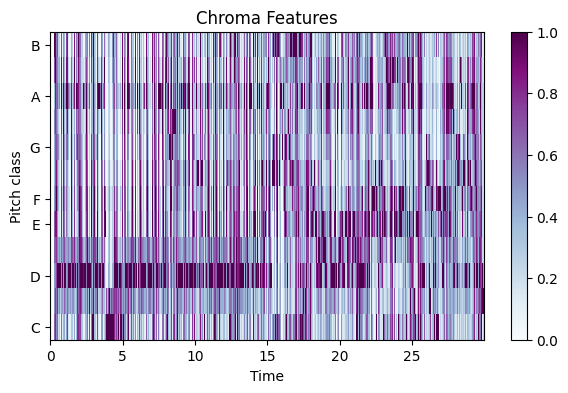

In [61]:
import librosa.display as lplt
chroma = librosa.feature.chroma_stft(y=data,sr=sr)
plt.figure(figsize=(7,4))
lplt.specshow(chroma,sr=sr,x_axis="time",y_axis="chroma",cmap="BuPu")
plt.colorbar()
plt.title("Chroma Features")
plt.show()

## Zero crossing rate

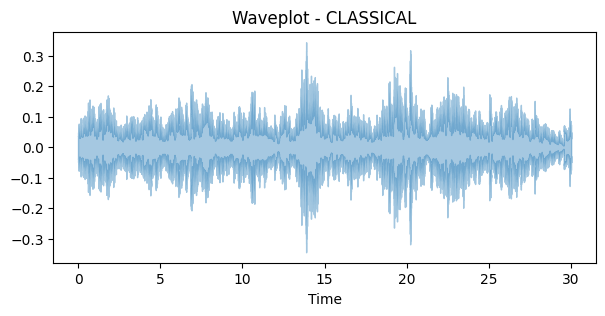

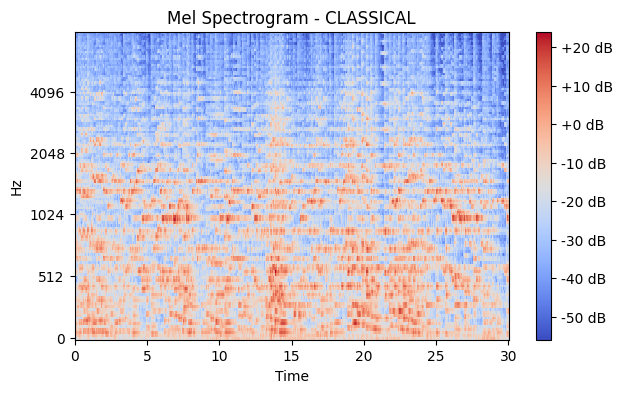

In [62]:
import IPython.display as ipd

# 1. CLASSICAL 
audio1= '../genres_original/classical/classical.00000.wav'
data, sr = librosa.load(audio1)
plt.figure(figsize=(7, 3))
librosa.display.waveshow(data, sr=sr,alpha=0.4,)
plt.title('Waveplot - CLASSICAL')

# Creating log mel spectrogram
plt.figure(figsize=(7, 4))
spectrogram = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=128,fmax=8000) 
spectrogram = librosa.power_to_db(spectrogram)
librosa.display.specshow(spectrogram, y_axis='mel', fmax=8000, x_axis='time');
plt.title('Mel Spectrogram - CLASSICAL')
plt.colorbar(format='%+2.0f dB');
# playing audio
ipd.Audio(audio1) 


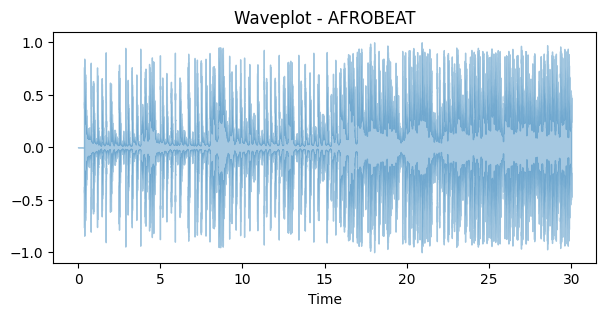

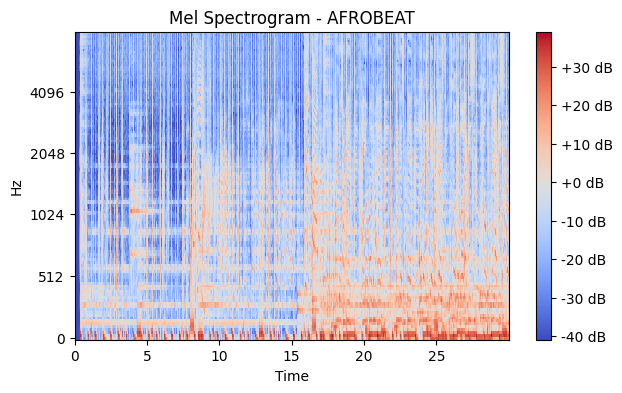

In [63]:
import IPython.display as ipd

# 1. BLUES 
audio1= '../genres_original/afrobeat/segment1_afrobeat_abracadabra.wav'
data, sr = librosa.load(audio1)
plt.figure(figsize=(7, 3))
librosa.display.waveshow(data, sr=sr,alpha=0.4,)
plt.title('Waveplot - AFROBEAT')

# Creating log mel spectrogram
plt.figure(figsize=(7, 4))
spectrogram = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=128,fmax=8000) 
spectrogram = librosa.power_to_db(spectrogram)
librosa.display.specshow(spectrogram, y_axis='mel', fmax=8000, x_axis='time');
plt.title('Mel Spectrogram - AFROBEAT')
plt.colorbar(format='%+2.0f dB');
# playing audio
ipd.Audio(audio1) 


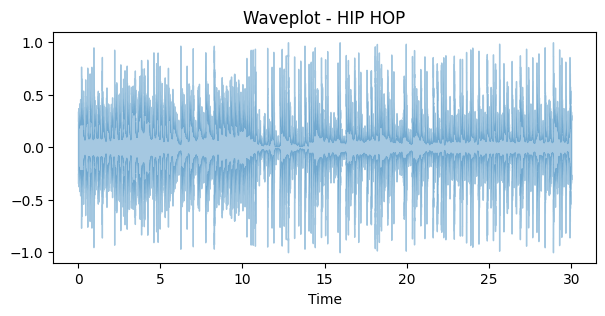

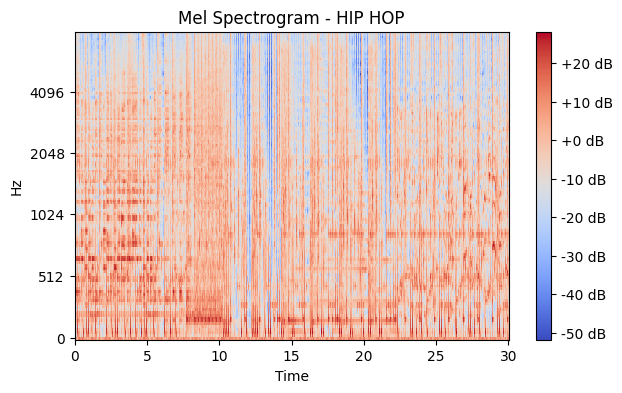

In [64]:
import IPython.display as ipd

# 1. BLUES 
audio1= '../genres_original/hiphop/hiphop.00000.wav'
data, sr = librosa.load(audio1)
plt.figure(figsize=(7, 3))
librosa.display.waveshow(data, sr=sr,alpha=0.4,)
plt.title('Waveplot - HIP HOP')

# Creating log mel spectrogram
plt.figure(figsize=(7, 4))
spectrogram = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=128,fmax=8000) 
spectrogram = librosa.power_to_db(spectrogram)
librosa.display.specshow(spectrogram, y_axis='mel', fmax=8000, x_axis='time');
plt.title('Mel Spectrogram - HIP HOP')
plt.colorbar(format='%+2.0f dB');
# playing audio
ipd.Audio(audio1) 
 

In [65]:
class_fit =  df.iloc[:, -1]
convertor = LabelEncoder()
y = convertor.fit_transform(class_fit)
y

array([1, 1, 1, ..., 0, 0, 0])

In [66]:
print(df.iloc[:, :-1])

        length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
0     661794.0          0.350088         0.088757  0.130228  0.002827   
1     661794.0          0.340914         0.094980  0.095948  0.002373   
2     661794.0          0.363637         0.085275  0.175570  0.002746   
3     661794.0          0.404785         0.093999  0.141093  0.006346   
4     661794.0          0.308526         0.087841  0.091529  0.002303   
...        ...               ...              ...       ...       ...   
1095      30.0          0.317626         0.091026  0.256253  0.010873   
1096      30.0          0.350240         0.087974  0.317964  0.014596   
1097      30.0          0.422172         0.080791  0.239201  0.016765   
1098      30.0          0.378991         0.100866  0.286072  0.018925   
1099      30.0          0.317626         0.091026  0.256253  0.010873   

      spectral_centroid_mean  spectral_centroid_var  spectral_bandwidth_mean  \
0                1784.165850           1.29

Standard scaler is used to standardize features by removing the mean and scaling to unit variance.

The standard score of sample x is calculated as:

z = (x - u) / s
Standardization of a dataset is a common requirement for many machine learning estimators: they might behave badly if the individual features do not more or less look like standard normally distributed data

In [67]:
from sklearn.preprocessing import StandardScaler
fit = StandardScaler()
X = fit.fit_transform(np.array(df.iloc[:, :-1], dtype=float))

## Dividing data into training and test sets

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
len(y_train)

737

In [69]:
len(y_test)

363

In [70]:
from keras.models import Sequential


In [71]:
def trainModel(model, epochs, optimizer):
    batch_size = 128
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics='accuracy')
    
    return model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=batch_size)

In [72]:
def plotValidate(history):
    print('Validation Accuracy', max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [73]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(11, activation='softmax'),
])

print(model.summary())
model_history = trainModel(model=model, epochs=600, optimizer='adam')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 512)               30208     
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               32896     
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_9 (Dense)             (None, 64)               

In [74]:
test_loss, test_acc = model.evaluate(X_test, y_test, batch_size=128)
print("The test loss is :", test_loss)
print("\nThe best test Accuracy is :", test_acc*100)

3/3 [==============================] - 0s 5ms/step - loss: 2.9534 - accuracy: 0.7328
The test loss is : 2.9533920288085938

The best test Accuracy is : 73.27823638916016


In [75]:
#### Prediction
# Sample testing
sample = X_test
sample = sample[np.newaxis, ...]
prediction = model.predict(X_test)
predicted_index = np.argmax(prediction, axis = 1)
print("Expected Index: {}, Predicted Index: {}".format(y_test, predicted_index))

12/12 [==============================] - 0s 2ms/step
Expected Index: [ 5 10  5  3  8  9  5  5  9  7 10  1  0  0  5  6  9  5  4  2  9  3  6  3
  5  5  6  9  9  3  9  8  7  3  8  5  7  2  0  5  8  4  0  9  3  3  1  5
  6  7  7  0  1 10  1  3  9  4  4  7  7  4  7  3  3  5  9  8 10  3  1  5
  0  5  8  7  1  3  6  8  5 10  5  1  4 10  0  9  2  0  3  4  1 10  8  0
  1  4  5  6  2  9  2  7  4  5  4 10  9 10  7 10  3  6  9  5  6  2  3  2
  4  2 10  9  2  7  8  5  4 10  0  6  6  1  9  2  6  0  2  1  3  5  5  4
 10  6  9  0  6  9  3  4  4  4  7  8  6 10  5 10  7  1  1  6  5  3  2  5
  3  7  0  7  9  7  3  4  7  2  1  4  6 10  0 10  9  8  6  7  4  4  8  1
 10  7  6  8  4  7  2  7  4  8 10  6  1  3  3  8  5  6  9  7  0  4  2  8
  5  8  4  3  2  2  7  3  2  3  4  8  3  8  6  7  7  1  6  9  1  2  8  5
  6  1  9 10 10  5  8  9  0  6  5 10  9  2  3  2  1  5  2  5  7  2  0  3
 10  6  0  1  2  6  8  0  2  1  1  5  3  4  7  5  0  5  1  0  4  1  5  3
  6  8  2  7  1  8  7  5  5  8  6  1  6  1  0  9  1  2 

In [76]:
# Sample testing
sample = X_test
sample = sample[np.newaxis, ...]
prediction = model.predict(X_test)
predicted_index = np.argmax(prediction, axis = 1)
print("Expected Index: {}, Predicted Index: {}".format(y_test, predicted_index))

12/12 [==============================] - 0s 2ms/step
Expected Index: [ 5 10  5  3  8  9  5  5  9  7 10  1  0  0  5  6  9  5  4  2  9  3  6  3
  5  5  6  9  9  3  9  8  7  3  8  5  7  2  0  5  8  4  0  9  3  3  1  5
  6  7  7  0  1 10  1  3  9  4  4  7  7  4  7  3  3  5  9  8 10  3  1  5
  0  5  8  7  1  3  6  8  5 10  5  1  4 10  0  9  2  0  3  4  1 10  8  0
  1  4  5  6  2  9  2  7  4  5  4 10  9 10  7 10  3  6  9  5  6  2  3  2
  4  2 10  9  2  7  8  5  4 10  0  6  6  1  9  2  6  0  2  1  3  5  5  4
 10  6  9  0  6  9  3  4  4  4  7  8  6 10  5 10  7  1  1  6  5  3  2  5
  3  7  0  7  9  7  3  4  7  2  1  4  6 10  0 10  9  8  6  7  4  4  8  1
 10  7  6  8  4  7  2  7  4  8 10  6  1  3  3  8  5  6  9  7  0  4  2  8
  5  8  4  3  2  2  7  3  2  3  4  8  3  8  6  7  7  1  6  9  1  2  8  5
  6  1  9 10 10  5  8  9  0  6  5 10  9  2  3  2  1  5  2  5  7  2  0  3
 10  6  0  1  2  6  8  0  2  1  1  5  3  4  7  5  0  5  1  0  4  1  5  3
  6  8  2  7  1  8  7  5  5  8  6  1  6  1  0  9  1  2 

## Use of audio file for classify data

In [77]:
#!pip install imageio
#!pip install torch
#!pip install tqdm
!pip install torchvision

In [541]:
# Import necessary libraries.
import os
import glob
import imageio
import random, shutil
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
import torch.nn.functional as F
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as display
import librosa
import librosa.display

In [542]:
# Create folder with training, testing and validation data.

spectrograms_dir = "../images_original/"
folder_names = ['../trainImages/', '../testImages/', '../valImages/']
train_dir = folder_names[0]
test_dir = folder_names[1]
val_dir = folder_names[2]

for f in folder_names:
  if os.path.exists(f):
    shutil.rmtree(f)
    os.mkdir(f)
  else:
    os.mkdir(f)

# Loop over all genres.

genres = list(os.listdir(spectrograms_dir))
for g in genres:
  # find all images & split in train, test, and validation
  src_file_paths= []
  for im in glob.glob(os.path.join(spectrograms_dir, f'{g}',"*.png"), recursive=True):
    src_file_paths.append(im)
  random.shuffle(src_file_paths)
  test_files = src_file_paths[0:10]
  val_files = src_file_paths[10:20]
  train_files = src_file_paths[20:]

  #  make destination folders for train and test images
  for f in folder_names:
    if not os.path.exists(os.path.join(f + f"{g}")):
      os.mkdir(os.path.join(f + f"{g}"))

  # copy training and testing images over
  for f in train_files:
    shutil.copy(f, os.path.join(os.path.join(train_dir + f"{g}") + '/',os.path.split(f)[1]))
  for f in test_files:
    shutil.copy(f, os.path.join(os.path.join(test_dir + f"{g}") + '/',os.path.split(f)[1]))
  for f in val_files:
    shutil.copy(f, os.path.join(os.path.join(val_dir + f"{g}") + '/',os.path.split(f)[1]))

In [543]:
# Data loading.

batch_size = 64 #recommended to use 64 as batch size
img_size = 224

normalize = transforms.Normalize(
        mean=[0.4914, 0.4822, 0.4465],
        std=[0.2023, 0.1994, 0.2010],
    )

train_dataset = datasets.ImageFolder(
    train_dir,
    transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        # normalize,
    ]))

train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

val_dataset = datasets.ImageFolder(
    val_dir,
    transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        # normalize,
    ]))

val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [544]:
# Make a CNN & train it to predict genres.

class music_net(nn.Module):
  def __init__(self):
    """Intitalize neural net layers"""
    super(music_net, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3, stride=1, padding=0)
    self.conv2 = nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, stride=1, padding=0)
    self.conv3 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=0)
    self.conv4 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=0)
    self.conv5 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=0)
    self.fc1 = nn.Linear(in_features=3200, out_features=3)

    self.batchnorm1 = nn.BatchNorm2d(num_features=8)
    self.batchnorm2 = nn.BatchNorm2d(num_features=16)
    self.batchnorm3 = nn.BatchNorm2d(num_features=32)
    self.batchnorm4 = nn.BatchNorm2d(num_features=64)
    self.batchnorm5 = nn.BatchNorm2d(num_features=128)

    self.dropout = nn.Dropout(p=0.3, inplace=False)


  def forward(self, x):
    # Conv layer 1.
    x = self.conv1(x)
    x = self.batchnorm1(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2)

    # Conv layer 2.
    x = self.conv2(x)
    x = self.batchnorm2(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2)

    # Conv layer 3.
    x = self.conv3(x)
    x = self.batchnorm3(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2)

    # Conv layer 4.
    x = self.conv4(x)
    x = self.batchnorm4(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2)

    # Conv layer 5.
    x = self.conv5(x)
    x = self.batchnorm5(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2)

    # Fully connected layer 1.
    x = torch.flatten(x, 1)
    x = self.dropout(x)
    x = self.fc1(x)
    x = F.softmax(x)

    return x


def train(model, device, train_loader, validation_loader, epochs):
  criterion =  nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
  train_loss, validation_loss = [], []
  train_acc, validation_acc = [], []
  with tqdm(range(epochs), unit='epoch') as tepochs:
    tepochs.set_description('Training')
    for epoch in tepochs:
      model.train()
      # keep track of the running loss
      running_loss = 0.
      correct, total = 0, 0

      for data, target in train_loader:
        
        # getting the training set
        data, target = data.to(device), target.to(device)
        
        # Get the model output (call the model with the data from this batch)
        output = model(data)
        # Zero the gradients out)
        optimizer.zero_grad()
        # Get the Loss
        loss  = criterion(output, target)
        # Calculate the gradients
        loss.backward()
        # Update the weights (using the training step of the optimizer)
        optimizer.step()

        tepochs.set_postfix(loss=loss.item())
        running_loss += loss  # add the loss for this batch

        # get accuracy
        _, predicted = torch.max(output, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

      # append the loss for this epoch
      train_loss.append(running_loss.detach().cpu().item()/len(train_loader))
      train_acc.append(correct/total)
      

      # evaluate on validation data
      model.eval()
      running_loss = 0.
      correct, total = 0, 0

      for data, target in validation_loader:
        # getting the validation set
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        tepochs.set_postfix(loss=loss.item())
        running_loss += loss.item()
        # get accuracy
        _, predicted = torch.max(output, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

      
      validation_loss.append(running_loss/len(validation_loader))
      validation_acc.append(correct/total)

  return train_loss, train_acc, validation_loss, validation_acc

In [545]:
# @title Helper functions (run me)

def set_device():
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
      print("WARNING: For this notebook to perform best, "
          "if possible, in the menu under `Runtime` -> "
          "`Change runtime type.`  select `GPU` ")
  else:
      print("GPU is enabled in this notebook.")

  return device

def plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc):
  epochs = len(train_loss)
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.plot(list(range(epochs)), train_loss, label='Training Loss')
  ax1.plot(list(range(epochs)), validation_loss, label='Validation Loss')
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Loss')
  ax1.set_title('Epoch vs Loss')
  ax1.legend()

  ax2.plot(list(range(epochs)), train_acc, label='Training Accuracy')
  ax2.plot(list(range(epochs)), validation_acc, label='Validation Accuracy')
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel('Accuracy')
  ax2.set_title('Epoch vs Accuracy')
  ax2.legend()
  fig.set_size_inches(15.5, 5.5)
  plt.show()

In [546]:
# Run training.
device = set_device()


In [84]:
#!pip install --upgrade jupyter
#!pip install --upgrade ipywidgets
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [547]:
# Run training.

net = music_net().to(device)
train_loss, train_acc, validation_loss, validation_acc = train(net, device, train_loader, val_loader, 150)

torch.save(net.state_dict(), 'audio_model1.pt')

  0%|          | 0/150 [00:00<?, ?epoch/s]

C:\Users\audre\AppData\Local\Temp\ipykernel_13456\461633382.py:58: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = F.softmax(x)


In [548]:
print(validation_acc)

#The accuracy is 85,55%

[0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.36666666666666664, 0.6666666666666666, 0.3333333333333333, 0.5, 0.6333333333333333, 0.6333333333333333, 0.6666666666666666, 0.7, 0.7, 0.7333333333333333, 0.9, 1.0, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 1.0, 0.9666666666666667, 0.9333333333333333, 0.9666666666666667, 0.9, 0.9333333333333333, 1.0, 0.9666666666666667, 0.9, 0.8666666666666667, 0.9333333333333333, 0.9666666666666667, 0.9666666666666667, 0.9, 0.8666666666666667, 0.9333333333333333, 0.9333333333333333, 0.9, 0.8666666666666667, 0.9, 0.9, 0.9333333333333333, 0.9333333333333333, 0.9333333333333333, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9333333333333333, 0.9666666666666667, 0.9333333333333333, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.9666666666666667, 0.96666666666

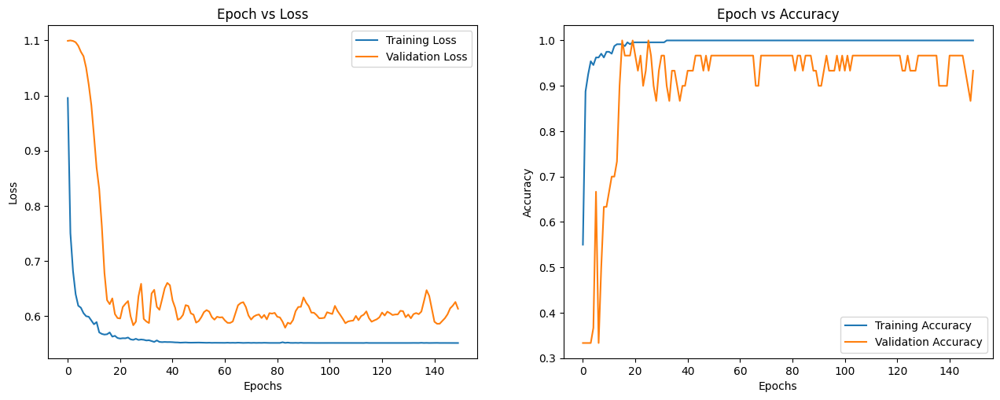

In [549]:
# Detach tensors from GPU
plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc)

In [550]:
model = music_net()
model.load_state_dict(torch.load('audio_model1.pt'))
model.eval()

music_net(
  (conv1): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=3200, out_features=3, bias=True)
  (batchnorm1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm3): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
)

In [343]:
# import os
# import librosa
# import matplotlib.pyplot as plt
# import numpy as np
# import scipy.signal as signal
# from torchaudio import transforms
# import torchaudio

# waveform, sample_rate = torchaudio.load("../genres_original/segment12_piano.wav")

# spectrogram = transforms.Spectrogram()

# specgram = spectrogram(waveform[0])



# # Enregistrez les spectrogrammes sous format PNG
# plt.imsave(os.path.join("../Scripts/testImages/piano" + ".png"), specgram)

In [615]:
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as signal
from torchaudio import transforms
import torchaudio

y, sr = librosa.load("../Scripts/segment2_piano.wav")

S = librosa.feature.melspectrogram(y= y, sr= sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Enregistrez les spectrogrammes sous format PNG
plt.imsave(os.path.join("../Scripts/testImages/hit2" + ".png"), S_DB)

In [616]:
from torchvision import transforms
import io
from PIL import  Image

image = "../Scripts/testImages/hit2.png"

with open(image, 'rb') as f:
    image_data = f.read()


img = Image.open(io.BytesIO(image_data)).convert('RGB')

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    # transforms.Normalize(
    #     mean=[0.4914, 0.4822, 0.4465],
    #     std=[0.2023, 0.1994, 0.2010],
    # )
])

input = preprocess(img).unsqueeze(0)

In [617]:
input

tensor([[[[0.2235, 0.1451, 0.1451,  ..., 0.5922, 0.4824, 0.4039],
          [0.2196, 0.1608, 0.2000,  ..., 0.6706, 0.5569, 0.5176],
          [0.2118, 0.1882, 0.2863,  ..., 0.7922, 0.6784, 0.6980],
          ...,
          [0.2667, 0.2667, 0.2667,  ..., 0.2667, 0.2667, 0.2667],
          [0.2667, 0.2667, 0.2667,  ..., 0.2667, 0.2667, 0.2667],
          [0.2667, 0.2667, 0.2667,  ..., 0.2667, 0.2667, 0.2667]],

         [[0.2235, 0.5137, 0.5725,  ..., 0.8471, 0.8196, 0.7922],
          [0.2588, 0.5765, 0.6353,  ..., 0.8588, 0.8353, 0.8196],
          [0.3137, 0.6784, 0.7333,  ..., 0.8784, 0.8627, 0.8627],
          ...,
          [0.0039, 0.0078, 0.0078,  ..., 0.0118, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039,  ..., 0.0078, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039]],

         [[0.4431, 0.5529, 0.5373,  ..., 0.2431, 0.3098, 0.3569],
          [0.4392, 0.5255, 0.4941,  ..., 0.1961, 0.2627, 0.2941],
          [0.4314, 0.4824, 0.4235,  ..., 0

In [618]:
with torch.no_grad():
    output = model(input)

#output = model(input)

C:\Users\audre\AppData\Local\Temp\ipykernel_13456\461633382.py:58: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = F.softmax(x)


In [619]:
_, prediction = torch.max(output.data, 1)
prediction = prediction.item()
prediction

2

0